##### Notatki
Tutorial tutaj: https://towardsdatascience.com/image-captioning-with-keras-teaching-computers-to-describe-pictures-c88a46a311b8

Dane Flickr 8k:
https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip

https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip


In [1]:
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
from pickle import dump, load
from time import time
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from nltk.translate.meteor_score import meteor_score
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu

Using TensorFlow backend.


In [2]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

filename = "../../Flickr8k_text/Flickr8k.token.txt"
# load descriptions
doc = load_doc(filename)
print(doc[:300])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the s


In [3]:
def load_descriptions(doc):
	mapping = dict()
	# process lines
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		if len(line) < 2:
			continue
		# take the first token as the image id, the rest as the description
		image_id, image_desc = tokens[0], tokens[1:]
		# extract filename from image id
		image_id = image_id.split('.')[0]
		# convert description tokens back to string
		image_desc = ' '.join(image_desc)
		# create the list if needed
		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping

# parse descriptions
descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

Loaded: 8092 


In [4]:
list(descriptions.keys())[:5]

['1000268201_693b08cb0e',
 '1001773457_577c3a7d70',
 '1002674143_1b742ab4b8',
 '1003163366_44323f5815',
 '1007129816_e794419615']

In [5]:
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [6]:
descriptions['1001773457_577c3a7d70']

['A black dog and a spotted dog are fighting',
 'A black dog and a tri-colored dog playing with each other on the road .',
 'A black dog and a white dog with brown spots are staring at each other in the street .',
 'Two dogs of different breeds looking at each other on the road .',
 'Two dogs on pavement moving toward each other .']

In [7]:
def clean_descriptions(descriptions):
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]
			# tokenize
			desc = desc.split()
			# convert to lower case
			desc = [word.lower() for word in desc]
			# remove punctuation from each token
			desc = [w.translate(table) for w in desc]
			# remove hanging 's' and 'a'
			desc = [word for word in desc if len(word)>1]
			# remove tokens with numbers in them
			desc = [word for word in desc if word.isalpha()]
			# store as string
			desc_list[i] =  ' '.join(desc)

# clean descriptions
clean_descriptions(descriptions)

In [8]:
descriptions['1000268201_693b08cb0e']

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

In [9]:
descriptions['1001773457_577c3a7d70']

['black dog and spotted dog are fighting',
 'black dog and tricolored dog playing with each other on the road',
 'black dog and white dog with brown spots are staring at each other in the street',
 'two dogs of different breeds looking at each other on the road',
 'two dogs on pavement moving toward each other']

In [10]:
# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc

# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 8763


In [11]:
# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

save_descriptions(descriptions, 'descriptions.txt')

In [12]:
# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load training dataset (6K)
filename = '../../Flickr8k_text/Flickr_8k.trainImages.txt'
train = load_set(filename)
test = load_set('../../Flickr8k_text/Flickr_8k.testImages.txt')
print('Dataset: %d' % len(train))

Dataset: 6000


In [13]:
# Below path contains all the images
images = '../../Flickr8k_Dataset/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')

In [14]:
# Below file conatains the names of images to be used in train data
train_images_file = '../../Flickr8k_text/Flickr_8k.trainImages.txt'
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i) # Add it to the list of train images

In [15]:
# Below file conatains the names of images to be used in test data
test_images_file = '../../Flickr8k_text/Flickr_8k.testImages.txt'
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in test_images: # Check if the image belongs to test set
        test_img.append(i) # Add it to the list of test images

In [16]:
# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

# descriptions
train_descriptions = load_clean_descriptions('descriptions.txt', train)
test_descriptions = load_clean_descriptions('descriptions.txt', test)
print('Descriptions: train=%d' % len(train_descriptions))

Descriptions: train=6000


In [17]:
def preprocess(image_path):
    # Convert all the images to size 299x299 as expected by the inception v3 model
    img = image.load_img(image_path, target_size=(299, 299))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess the images using preprocess_input() from inception module
    x = preprocess_input(x)
    return x

In [18]:
# Load the inception v3 model
model = InceptionV3(weights='imagenet')

In [19]:
# Create a new model, by removing the last layer (output layer) from the inception v3
model_new = Model(model.input, model.layers[-2].output)

In [20]:
# Function to encode a given image into a vector of size (2048, )
def encode(image):
    image = preprocess(image) # preprocess the image
    fea_vec = model_new.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

###### Notatki
Poniższy kod zajmuje bardzo dużo czasu.

In [21]:
# Call the funtion to encode all the train images
# This will take a while on CPU - Execute this only once
start = time()
encoding_train = {}
for img in train_img:
    encoding_train[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

Time taken in seconds = 1682.6151905059814


In [22]:
import os
import pickle

writepath = 'Pickle/encoded_train_images_en_eval.pkl'

mode = 'a' if os.path.exists(writepath) else 'wb'

# Save the bottleneck train features to disk
with open("Pickle/encoded_train_images_en_eval.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_train, encoded_pickle)

In [23]:
# Call the funtion to encode all the test images - Execute this only once
start = time()
encoding_test = {}
for img in test_img:
    encoding_test[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

Time taken in seconds = 372.1013147830963


In [24]:
# Save the bottleneck test features to disk
with open("Pickle/encoded_test_images_en_eval.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_test, encoded_pickle)

In [25]:
train_features = load(open("Pickle/encoded_train_images_en_eval.pkl", "rb"))
print('Photos: train=%d' % len(train_features))

Photos: train=6000


In [26]:
# Create a list of all the training captions
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
len(all_train_captions)

30000

In [27]:
# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 7578 -> 1651


In [28]:
ixtoword = {}
wordtoix = {}

ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

In [29]:
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

1652

In [30]:
# convert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)

# determine the maximum sequence length
max_length = max_length(train_descriptions)
print('Description Length: %d' % max_length)

Description Length: 34


In [31]:
# data generator, intended to be used in a call to model.fit_generator()
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield [[array(X1), array(X2)], array(y)]
                X1, X2, y = list(), list(), list()
                n=0

Embedings pobrane stąd: https://www.kaggle.com/incorpes/glove6b200d

In [32]:
# Load Glove vectors
glove_dir = '../../glove'
embeddings_index = {} # empty dictionary
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [33]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

In [34]:
embedding_matrix.shape

(1652, 200)

In [35]:
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [36]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 34)           0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 2048)         0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 34, 200)      330400      input_3[0][0]                    
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 2048)         0           input_2[0][0]                    
____________________________________________________________________________________________

In [37]:
model.layers[2]

In [38]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [39]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [40]:
epochs = 10
number_pics_per_bath = 3
steps = len(train_descriptions)//number_pics_per_bath

Kolejny dość czasochłonny krok

In [41]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    writepath = 'model_weights/model_' + str(i) + '.h5'

    mode = 'a' if os.path.exists(writepath) else 'wb'
    file = open(writepath, mode)
    model.save(file)

Epoch 1/1
2000/2000 [==============================] - 797s 399ms/step - loss: 4.1313


C:\Users\Ostry\AppData\Roaming\Python\Python37\site-packages\keras\utils\io_utils.py:416: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  with h5py.File('in-memory-h5py', driver='core', backing_store=False) as h5file:
C:\Users\Ostry\AppData\Roaming\Python\Python37\site-packages\keras\utils\io_utils.py:420: H5pyDeprecationWarning: File.fid has been deprecated. Use File.id instead.
  binary_data = h5file.fid.get_file_image()


Epoch 1/1
2000/2000 [==============================] - 887s 444ms/step - loss: 3.4234
Epoch 1/1
2000/2000 [==============================] - 867s 433ms/step - loss: 3.2014
Epoch 1/1
2000/2000 [==============================] - 823s 411ms/step - loss: 3.0681
Epoch 1/1
2000/2000 [==============================] - 784s 392ms/step - loss: 2.9729
Epoch 1/1
2000/2000 [==============================] - 805s 403ms/step - loss: 2.8972
Epoch 1/1
2000/2000 [==============================] - 860s 430ms/step - loss: 2.8366
Epoch 1/1
2000/2000 [==============================] - 841s 421ms/step - loss: 2.7881
Epoch 1/1
2000/2000 [==============================] - 839s 419ms/step - loss: 2.7484
Epoch 1/1
2000/2000 [==============================] - 819s 410ms/step - loss: 2.7139


In [42]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('model_weights/model_' + str(i) + '.h5')

Epoch 1/1
2000/2000 [==============================] - 834s 417ms/step - loss: 2.6812
Epoch 1/1
2000/2000 [==============================] - 827s 413ms/step - loss: 2.6535
Epoch 1/1
2000/2000 [==============================] - 1800s 900ms/step - loss: 2.6304
Epoch 1/1
2000/2000 [==============================] - 15610s 8s/step - loss: 2.6112
Epoch 1/1
2000/2000 [==============================] - 816s 408ms/step - loss: 2.5894
Epoch 1/1
2000/2000 [==============================] - 843s 422ms/step - loss: 2.5724
Epoch 1/1
2000/2000 [==============================] - 839s 420ms/step - loss: 2.5603
Epoch 1/1
2000/2000 [==============================] - 788s 394ms/step - loss: 2.5427
Epoch 1/1
2000/2000 [==============================] - 780s 390ms/step - loss: 2.5284
Epoch 1/1
2000/2000 [==============================] - 779s 390ms/step - loss: 2.5157


In [43]:
# model.optimizer.lr = 0.0001
epochs = 10
number_pics_per_bath = 6
steps = len(train_descriptions)//number_pics_per_bath

In [44]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    #model.save('./model_weights/model_' + str(i) + '.h5')

Epoch 1/1
1000/1000 [==============================] - 737s 737ms/step - loss: 2.4727
Epoch 1/1
1000/1000 [==============================] - 737s 737ms/step - loss: 2.4536
Epoch 1/1
1000/1000 [==============================] - 730s 730ms/step - loss: 2.4399
Epoch 1/1
1000/1000 [==============================] - 734s 734ms/step - loss: 2.4313
Epoch 1/1
1000/1000 [==============================] - 730s 730ms/step - loss: 2.4201
Epoch 1/1
1000/1000 [==============================] - 847s 847ms/step - loss: 2.4086
Epoch 1/1
1000/1000 [==============================] - 731s 731ms/step - loss: 2.4014
Epoch 1/1
1000/1000 [==============================] - 727s 727ms/step - loss: 2.3892
Epoch 1/1
1000/1000 [==============================] - 736s 736ms/step - loss: 2.3819
Epoch 1/1
1000/1000 [==============================] - 735s 735ms/step - loss: 2.3759


In [45]:
model.save_weights('model_weights/model_30_en_eval.h5')

In [46]:
model.load_weights('model_weights/model_30_en_eval.h5')

In [47]:
images = '../../Flickr8k_Dataset/'

In [48]:
with open("Pickle/encoded_train_images_en_eval.pkl", "rb") as encoded_pickle:
    encoding_train = load(encoded_pickle)
with open("Pickle/encoded_test_images_en_eval.pkl", "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)

In [49]:
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [50]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [51]:
#function for calculating cider metric
def cider(given_captions, prediction):
    prediction_arr = []
    prediction_arr.append(prediction)
    vectorizer = TfidfVectorizer()
    trainedV = vectorizer.fit(given_captions)
    givenTfIdf = trainedV.transform(given_captions).toarray()
    predTfIdf = trainedV.transform(prediction_arr).toarray()
    partialCiders = 0
    help_arr = []
    
    for c in givenTfIdf:
        help_arr.append(c)
        partialCiders = partialCiders + cosine_similarity(predTfIdf,help_arr)
        help_arr = []
        
    return partialCiders/len(givenTfIdf)

In [54]:
import warnings; warnings.simplefilter('ignore')
from statistics import mean
from IPython.display import clear_output

#preparation of metrics lists
bleu_train_scores = []
meteor_train_scores = []
cider_train_scores = []

bleu_test_scores = []    
meteor_test_scores = []
cider_test_scores = []
    
for i in range(0,1):
    
    train_pics = list(encoding_train.keys())
    test_pics = list(encoding_test.keys())

    #calculation of metrics for train images dataset
    for j in range(0,len(train_pics)):
        pic = train_pics[j]
        image = encoding_train[pic].reshape((1,2048))

        actual_desc_0 = train_descriptions[pic[:-4]][0]
        actual_desc_1 = train_descriptions[pic[:-4]][1]
        actual_desc_2 = train_descriptions[pic[:-4]][2]
        actual_desc_3 = train_descriptions[pic[:-4]][3]
        actual_desc_4 = train_descriptions[pic[:-4]][4]
        generated = greedySearch(image)
        bleu_train_scores.append(
            sentence_bleu(
                [actual_desc_0.split(), actual_desc_1.split(), actual_desc_2.split(), actual_desc_3.split(),
                 actual_desc_4.split()],
                generated.split())
        )
        meteor_train_scores.append(meteor_score(train_descriptions[pic.split('.')[0]],generated))
        cider_train_scores.append(cider(train_descriptions[pic.split('.')[0]],generated)[0][0])

        clear_output(wait=True)
        print('train',j, flush=True)

    #calculation of metrics for test images dataset
    for j in range(0,len(test_pics)):
        pic = test_pics[j]
        image = encoding_test[pic].reshape((1,2048))

        actual_desc_0 = test_descriptions[pic[:-4]][0]
        actual_desc_1 = test_descriptions[pic[:-4]][1]
        actual_desc_2 = test_descriptions[pic[:-4]][2]
        actual_desc_3 = test_descriptions[pic[:-4]][3]
        actual_desc_4 = test_descriptions[pic[:-4]][4]
        generated = greedySearch(image)
        bleu_test_scores.append(
            sentence_bleu(
                [actual_desc_0.split(), actual_desc_1.split(), actual_desc_2.split(), actual_desc_3.split(),
                 actual_desc_4.split()],
                generated.split())
        )
        meteor_test_scores.append(meteor_score(test_descriptions[pic.split('.')[0]],generated))
        cider_test_scores.append(cider(test_descriptions[pic.split('.')[0]],generated)[0][0])

        clear_output(wait=True)
        print('test',j, flush=True)


result_data = {}

#calculate mean score based on socres list for each metric
result_data[str(0)] = [
    mean(bleu_train_scores),
    mean(bleu_test_scores),
    mean(meteor_train_scores),
    mean(meteor_test_scores),
    mean(cider_train_scores),
    mean(cider_test_scores)
    ]
    

result = pd.DataFrame.from_dict(
    result_data,
    orient='index',
    columns=['Bleu TREN', 'Bleu TEST', 'Meteor TREN', 'Meteor TEST', 'CIDEr TREN', 'CIDEr TEST']
)

result

test 999


,Bleu TREN,Bleu TEST,Meteor TREN,Meteor TEST,CIDEr TREN,CIDEr TEST
0,0.041831,0.019986,0.259155,0.235939,0.242876,0.231452


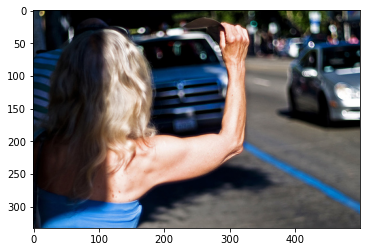

Test 0 : young boy wearing red shirt is standing in front of yellow truck
Meteor score:  0.08620689655172413
Cider score:  0.1860372499300457


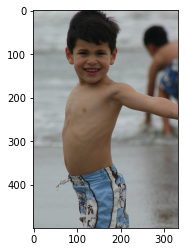

Test 1 : boy in swim trunks is running along the beach
Meteor score:  0.5773420479302832
Cider score:  0.3124589377157985


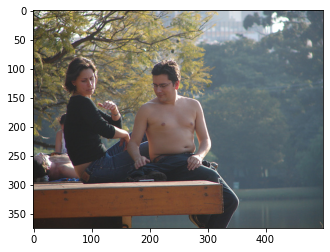

Test 2 : man in black shirt and jeans stands on curb
Meteor score:  0.1851851851851852
Cider score:  0.3303163323396928


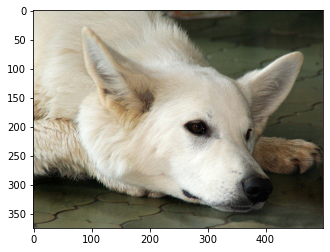

Test 3 : dog is running through the grass
Meteor score:  0.13297872340425532
Cider score:  0.2689197669624332


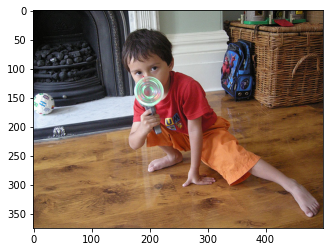

Test 4 : young boy wearing red shirt is standing in front of doorway
Meteor score:  0.29512195121951224
Cider score:  0.2230384260686308


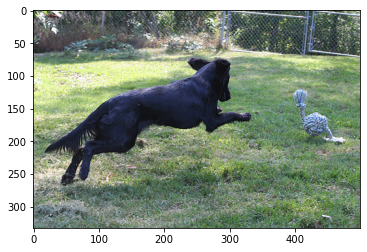

Test 5 : black dog is running through the grass
Meteor score:  0.30355097365406647
Cider score:  0.23802505934359716


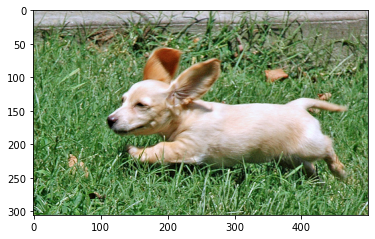

Test 6 : white dog is walking on the grass
Meteor score:  0.42613636363636365
Cider score:  0.3822451495961555


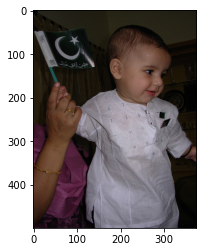

Test 7 : young boy wearing blue shirt is smiling whilst standing in front of an old bus
Meteor score:  0.1703703703703704
Cider score:  0.18727615911925377


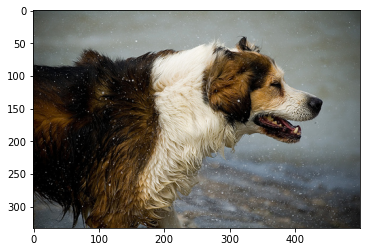

Test 8 : dog is wading through water
Meteor score:  0.2690058479532163
Cider score:  0.20681562302401235


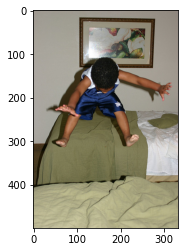

Test 9 : two young boys are sitting on bed laughing
Meteor score:  0.4445422535211268
Cider score:  0.28657804366510736


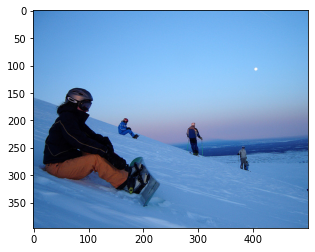

Test 10 : man in red coat is snowboarding on snowy mountain
Meteor score:  0.1388888888888889
Cider score:  0.17222621655615017


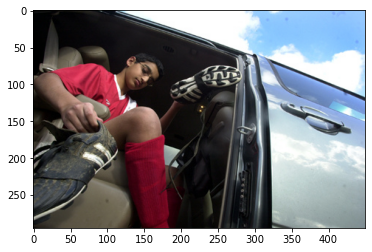

Test 11 : man in black shirt and jeans is standing on the street
Meteor score:  0.16304347826086954
Cider score:  0.26248159856408915


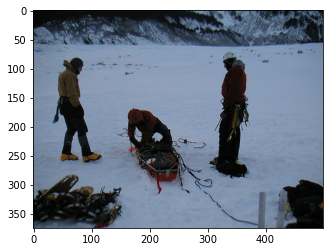

Test 12 : two people are standing on top of snow covered hill
Meteor score:  0.275735294117647
Cider score:  0.2483235441844601


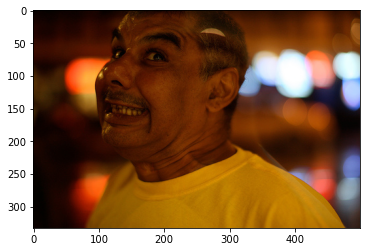

Test 13 : man with beard and beard is smiling
Meteor score:  0.2410901467505241
Cider score:  0.21923965135977874


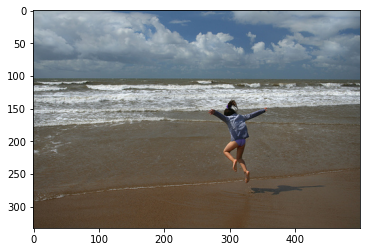

Test 14 : boy in red shorts is jumping into the water
Meteor score:  0.32051282051282054
Cider score:  0.4014778804234833


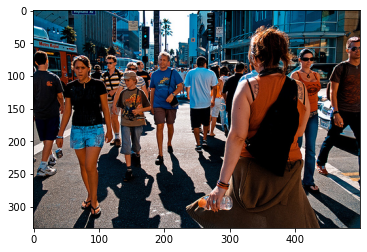

Test 15 : group of people stand on sidewalk
Meteor score:  0.2937420178799489
Cider score:  0.2689479922243904


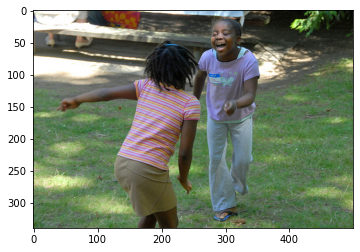

Test 16 : two children are playing with tires
Meteor score:  0.33844189016602805
Cider score:  0.26414930426469085


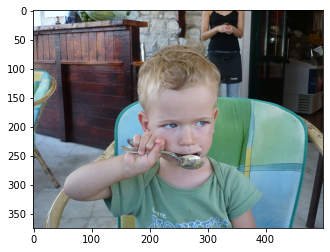

Test 17 : young boy wearing red shirt is smiling whilst standing in front of yellow truck
Meteor score:  0.10067114093959734
Cider score:  0.2266390426157839


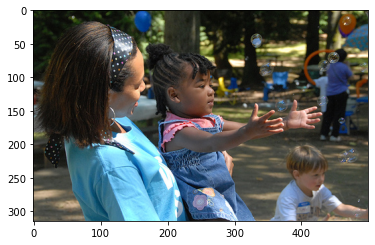

Test 18 : two girls are smiling and laughing
Meteor score:  0.08771929824561403
Cider score:  0.0


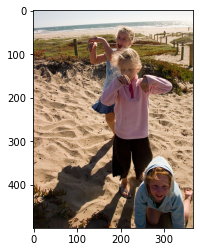

Test 19 : man in red shirt is standing on rocks near the water
Meteor score:  0.12605042016806722
Cider score:  0.2920763558396278


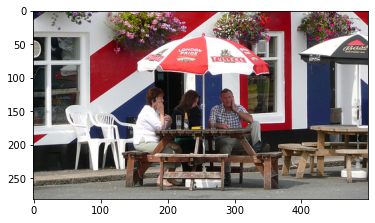

Test 20 : man in white shirt and jeans walks down the street
Meteor score:  0.05813953488372093
Cider score:  0.115792197566949


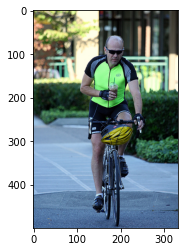

Test 21 : man in blue shirt and jeans walks down the street
Meteor score:  0.3270348837209302
Cider score:  0.2804502044838314


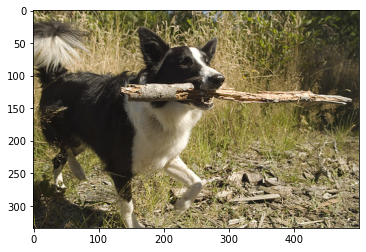

Test 22 : dog runs through the grass
Meteor score:  0.2516778523489933
Cider score:  0.19374960629963692


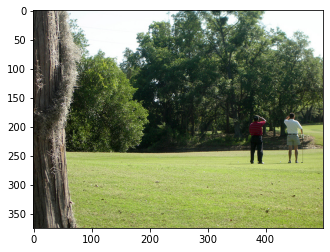

Test 23 : two children are walking through the grass
Meteor score:  0.11278195488721805
Cider score:  0.2436616243916057


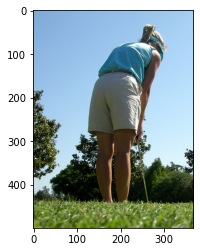

Test 24 : young girl in pink shirt is blowing bubbles
Meteor score:  0.10204081632653061
Cider score:  0.19342572886882206


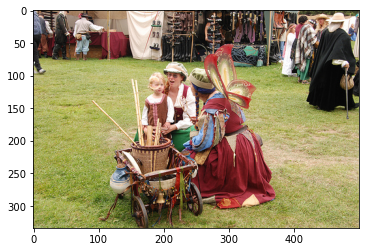

Test 25 : two girls are sitting on wooden platform
Meteor score:  0.1435705368289638
Cider score:  0.12096305812916626


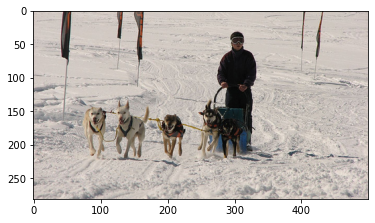

Test 26 : team of dogs pulls sled through the snow
Meteor score:  0.5077551020408162
Cider score:  0.29402687949119494


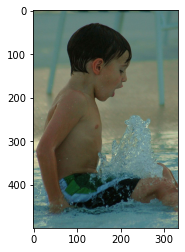

Test 27 : small boy in swimming trunks is splashing in the water
Meteor score:  0.446
Cider score:  0.33104852765373766


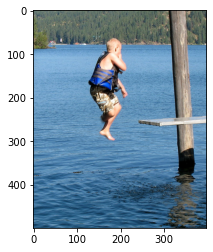

Test 28 : man fishes in the ocean
Meteor score:  0.09615384615384616
Cider score:  0.22008292446135003


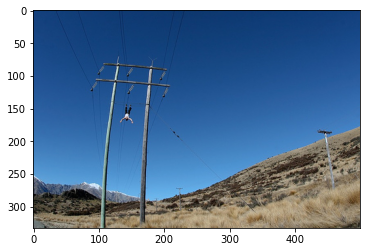

Test 29 : man is standing on top of rocks with his arms out
Meteor score:  0.09900990099009903
Cider score:  0.1715894977922927


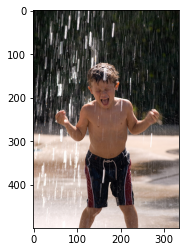

Test 30 : young boy in red shirt is splashing in puddle
Meteor score:  0.13888888888888887
Cider score:  0.26048015334780245


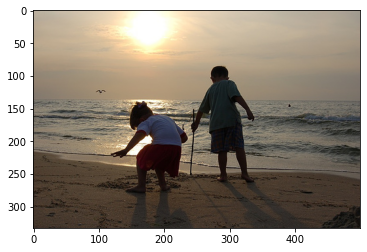

Test 31 : child is walking along the beach carrying the beach
Meteor score:  0.2839506172839506
Cider score:  0.2902290575803586


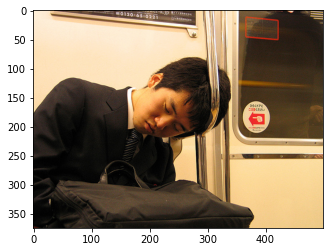

Test 32 : man in black shirt and jeans sits on bench
Meteor score:  0.23662551440329216
Cider score:  0.2288298219514707


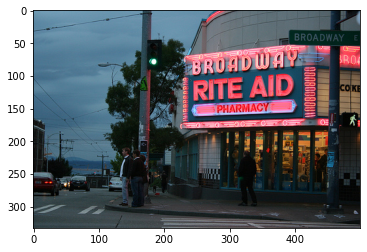

Test 33 : man in white shirt and jeans walks down the street
Meteor score:  0.18790849673202614
Cider score:  0.21541597743202576


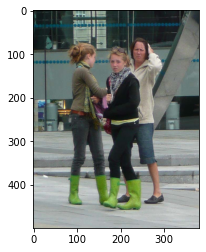

Test 34 : woman walking by sidewalk
Meteor score:  0.27186761229314416
Cider score:  0.1759792982166596


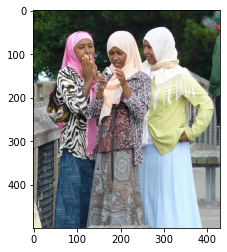

Test 35 : woman in red shirt and tank top stands next to her
Meteor score:  0.09900990099009903
Cider score:  0.2098712423828843


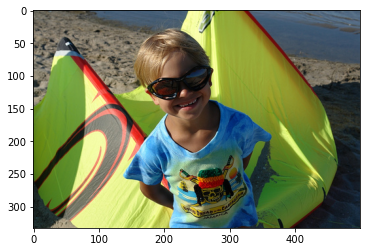

Test 36 : man in red shirt is standing on the edge of snow covered mountain
Meteor score:  0.22058823529411764
Cider score:  0.18788651556584351


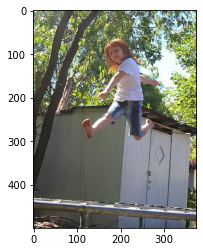

Test 37 : boy in red shirt is climbing up very large rock wall
Meteor score:  0.04201680672268908
Cider score:  0.09627500097698558


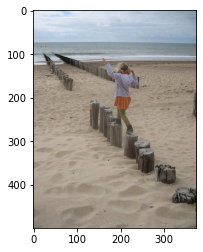

Test 38 : two people sit on the edge of the beach
Meteor score:  0.23662551440329216
Cider score:  0.3285018632908236


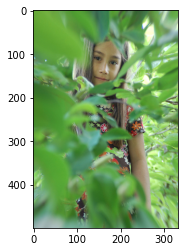

Test 39 : young girl in pink shirt is standing on the grass next to the water
Meteor score:  0.2690058479532164
Cider score:  0.31765546429629765


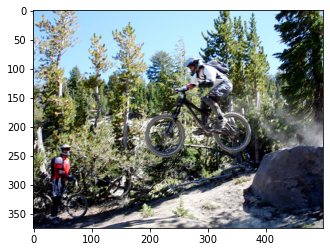

Test 40 : man in red helmet riding bike down rocky hill
Meteor score:  0.15151515151515152
Cider score:  0.21907512493281467


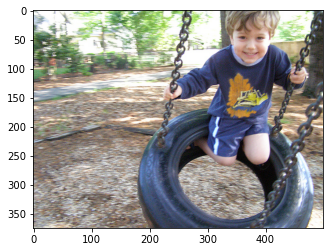

Test 41 : young boy is swinging on swing
Meteor score:  0.5717948717948719
Cider score:  0.44148118867092123


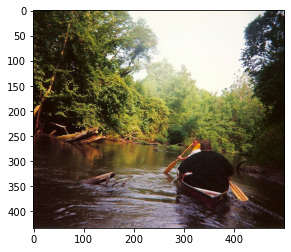

Test 42 : man in red canoe paddling against lake
Meteor score:  0.1597222222222222
Cider score:  0.27874981379658814


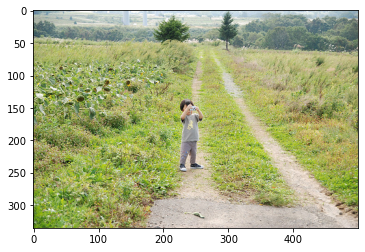

Test 43 : two children are playing in the grass
Meteor score:  0.2634593356242841
Cider score:  0.18785622160633064


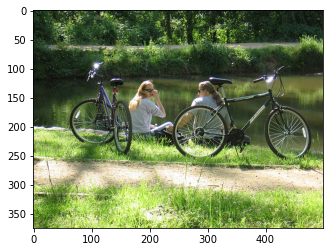

Test 44 : man in summer clothing rides bike on the street
Meteor score:  0.11904761904761907
Cider score:  0.2054735660116922


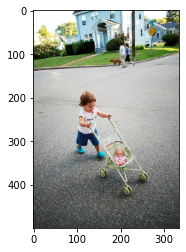

Test 45 : small child is running through woodland
Meteor score:  0.21551724137931036
Cider score:  0.1755700843892268


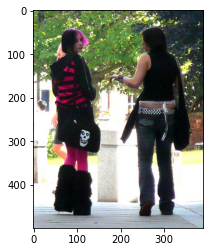

Test 46 : woman in black and white jacket is standing in front of crowd
Meteor score:  0.091324200913242
Cider score:  0.0887244053045054


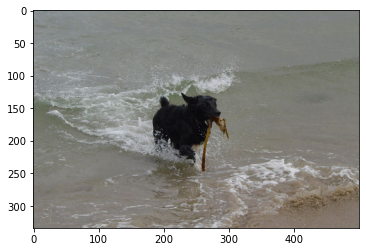

Test 47 : dog running through water
Meteor score:  0.0970873786407767
Cider score:  0.2558759868781283


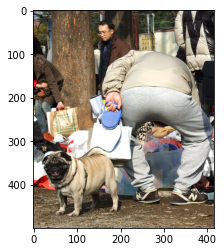

Test 48 : woman in red jacket is standing in front of white truck
Meteor score:  0.0824175824175824
Cider score:  0.1045806719279158


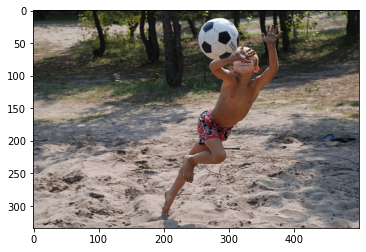

Test 49 : two boys are playing soccer on the beach
Meteor score:  0.5742821473158551
Cider score:  0.2038426104202781


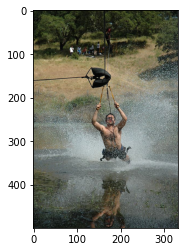

Test 50 : man in red shirt is in the water
Meteor score:  0.5438202247191011
Cider score:  0.36944225623396204


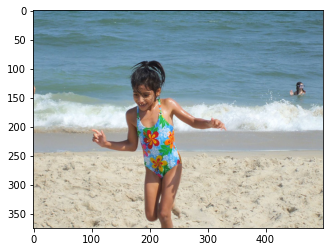

Test 51 : boy in floral shorts is jumping into the water
Meteor score:  0.18930041152263377
Cider score:  0.31262735864862323


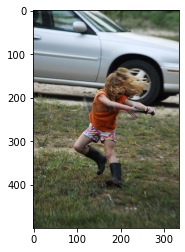

Test 52 : boy in blue shirt is running in field
Meteor score:  0.1530612244897959
Cider score:  0.2667873502775847


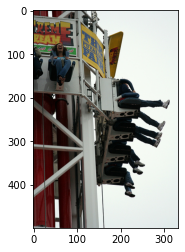

Test 53 : man in white shirt and hat is standing next to man in black jacket
Meteor score:  0.05263157894736842
Cider score:  0.09572264130228816


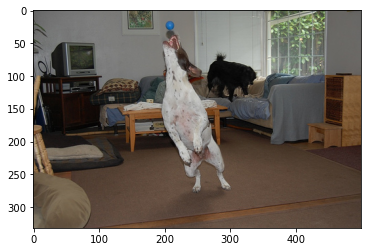

Test 54 : two dogs are sniffing each other
Meteor score:  0.1703703703703704
Cider score:  0.1240903357303688


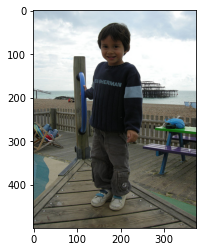

Test 55 : man in black shirt and jeans is standing next to woman in black jacket
Meteor score:  0.24093511450381686
Cider score:  0.20496075909012657


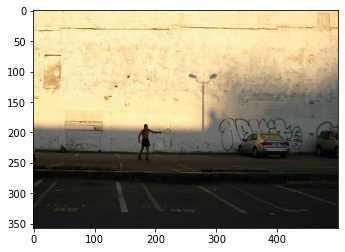

Test 56 : man in white shirt and jeans walks down the street
Meteor score:  0.18790849673202614
Cider score:  0.27333907876964136


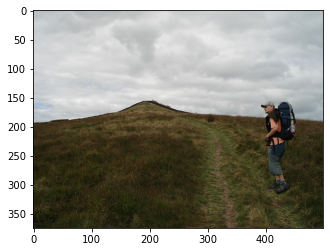

Test 57 : man in green shirt is standing in grassy field
Meteor score:  0.1851851851851852
Cider score:  0.2721708551346531


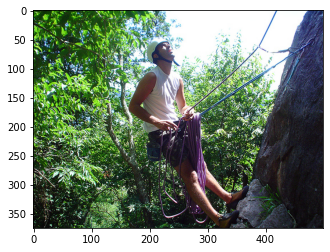

Test 58 : man in red shirt is climbing up sheer tree
Meteor score:  0.31794871794871804
Cider score:  0.3667574008974232


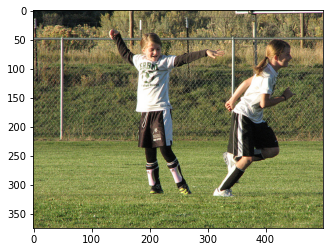

Test 59 : two boys are playing with frisbee
Meteor score:  0.22417153996101363
Cider score:  0.1621055553358123


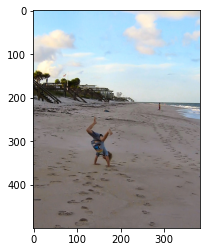

Test 60 : child is walking along the beach carrying the ocean
Meteor score:  0.3444444444444445
Cider score:  0.4164855663848927


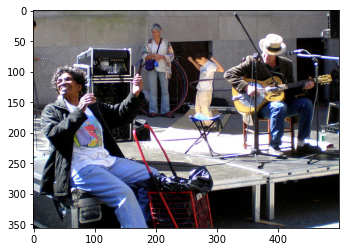

Test 61 : man in black shirt and tie is sitting on the ground near an advertisement
Meteor score:  0.24572649572649571
Cider score:  0.2441736590632672


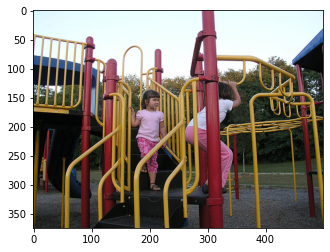

Test 62 : two children are playing on the grass
Meteor score:  0.35967741935483877
Cider score:  0.3082588347921587


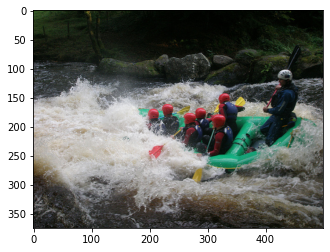

Test 63 : group of people are rafting down river rapids
Meteor score:  0.41977611940298504
Cider score:  0.39540597460505716


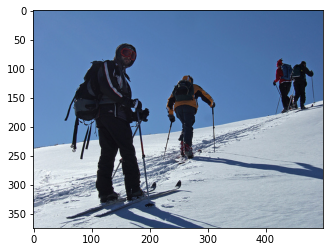

Test 64 : woman skiing down snowy hill
Meteor score:  0.05813953488372093
Cider score:  0.14201775678465536


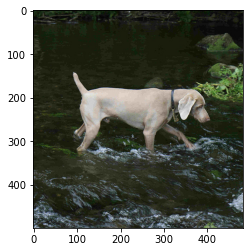

Test 65 : dog running through water
Meteor score:  0.13157894736842105
Cider score:  0.2852469692416634


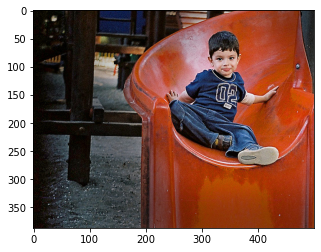

Test 66 : man in black shirt and jeans walks down the street
Meteor score:  0.06097560975609756
Cider score:  0.16907562831126513


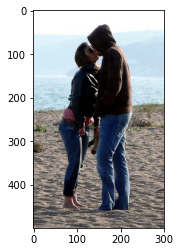

Test 67 : man in red shirt is standing on the shore of the water
Meteor score:  0.16129032258064518
Cider score:  0.3195655497320211


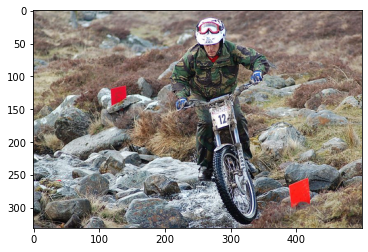

Test 68 : man in summer gear rides bike down dirt path
Meteor score:  0.20202020202020204
Cider score:  0.27270833847285975


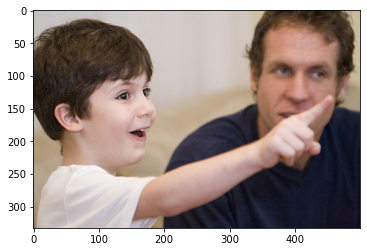

Test 69 : young boy wearing red shirt is smiling whilst standing in front of blue brick building
Meteor score:  0.12820512820512822
Cider score:  0.1977330978590389


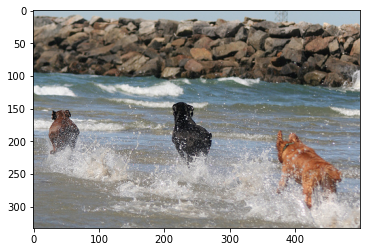

Test 70 : two dogs are playing in the water
Meteor score:  0.4207547169811321
Cider score:  0.314065284143228


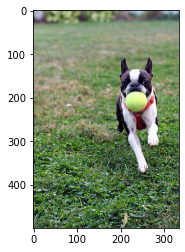

Test 71 : dog is running through the grass
Meteor score:  0.3044025157232705
Cider score:  0.31925312495369473


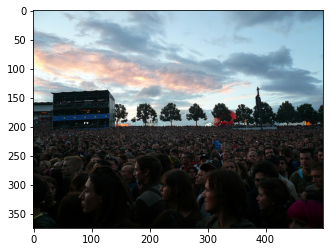

Test 72 : group of people stand in line of building
Meteor score:  0.2525
Cider score:  0.2667536811137092


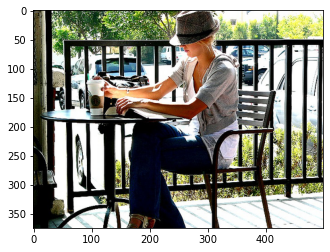

Test 73 : man in black shirt and jeans sits on bench
Meteor score:  0.15151515151515152
Cider score:  0.20847590214881806


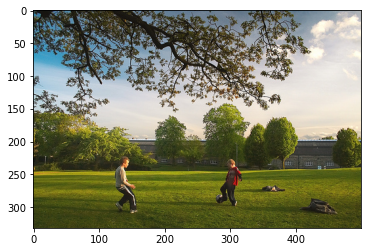

Test 74 : two young boys are running through grassy area
Meteor score:  0.20444444444444443
Cider score:  0.22688247169215175


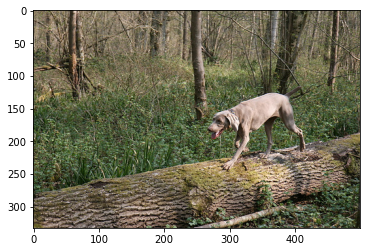

Test 75 : dog running through the woods
Meteor score:  0.24572649572649571
Cider score:  0.26990140552285774


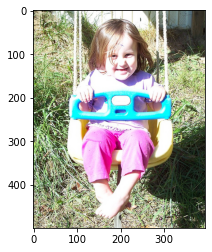

Test 76 : young boy is happily swinging on swing
Meteor score:  0.4189435336976321
Cider score:  0.23781553302730987


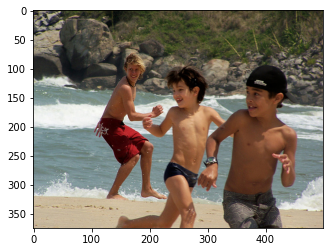

Test 77 : boy in red shorts is splashing in the water
Meteor score:  0.14492753623188406
Cider score:  0.20272349629726025


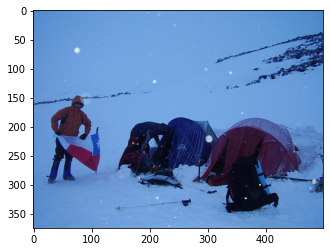

Test 78 : two children are playing in the snow
Meteor score:  0.2560386473429952
Cider score:  0.17647202387646252


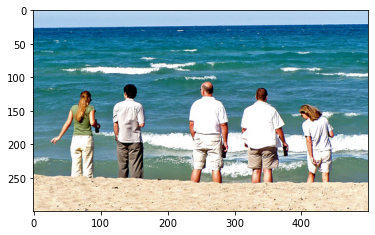

Test 79 : the boy is walking along the beach
Meteor score:  0.09375
Cider score:  0.23626992869305954


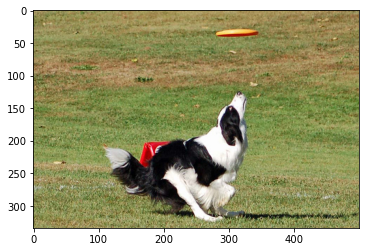

Test 80 : black and white dog is running through grassy area
Meteor score:  0.42564102564102574
Cider score:  0.33459095808382255


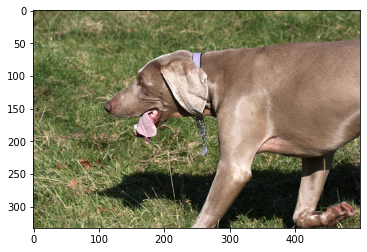

Test 81 : brown dog is running through the grass
Meteor score:  0.32608695652173914
Cider score:  0.29314860398387976


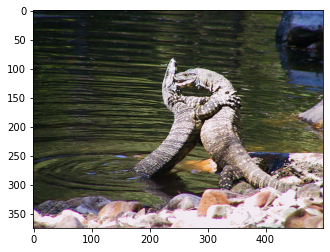

Test 82 : the black dog is standing in the water
Meteor score:  0.3680555555555556
Cider score:  0.28326560813563034


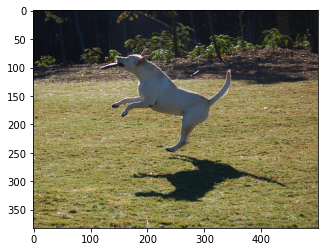

Test 83 : white dog is running on the grass
Meteor score:  0.2634593356242841
Cider score:  0.20674667812860567


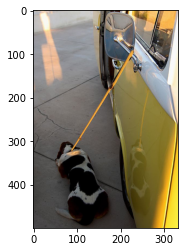

Test 84 : two dogs are playing in cage
Meteor score:  0.08771929824561403
Cider score:  0.0


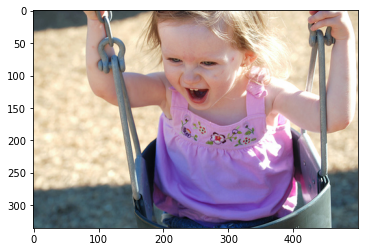

Test 85 : small boy in red shirt is smiling whilst swinging on tire swing
Meteor score:  0.2446705426356589
Cider score:  0.29108339865719957


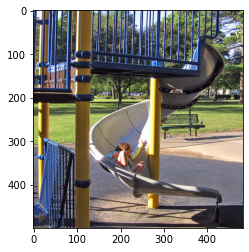

Test 86 : boy in red shirt is jumping over railings
Meteor score:  0.08064516129032259
Cider score:  0.20981063164978292


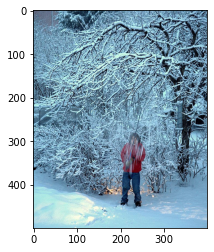

Test 87 : two people are standing on top of hill
Meteor score:  0.07042253521126761
Cider score:  0.10281629185958578


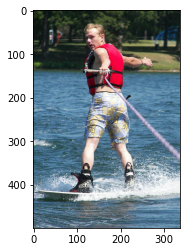

Test 88 : man in yellow wetsuit surfs
Meteor score:  0.165929203539823
Cider score:  0.20401012067716845


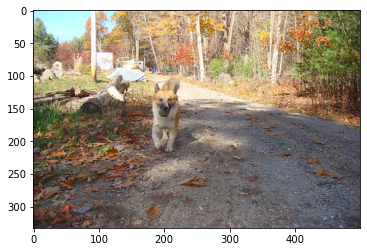

Test 89 : dog runs through the woods
Meteor score:  0.24572649572649571
Cider score:  0.2076437442104826


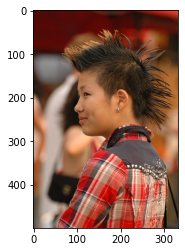

Test 90 : woman with beads around her neck is standing in front of crowd
Meteor score:  0.125
Cider score:  0.19430933825376273


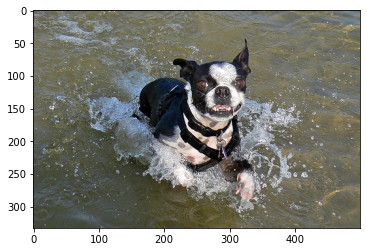

Test 91 : dog is running through the water
Meteor score:  0.5434782608695652
Cider score:  0.36822103036588133


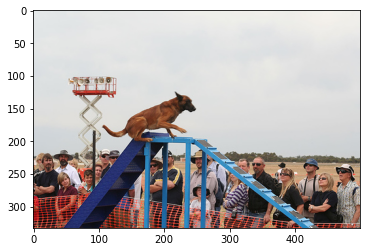

Test 92 : brown dog is playing with toy in the grass
Meteor score:  0.20833333333333331
Cider score:  0.21680638341444528


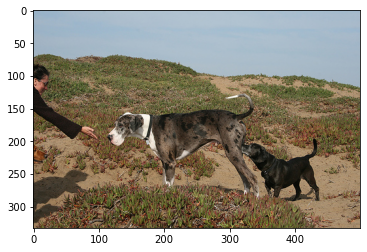

Test 93 : two dogs are playing together on the grass
Meteor score:  0.1530612244897959
Cider score:  0.17350285056334525


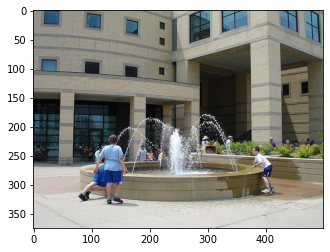

Test 94 : little boy in red shirt is standing in the spray
Meteor score:  0.0847457627118644
Cider score:  0.12014779815069984


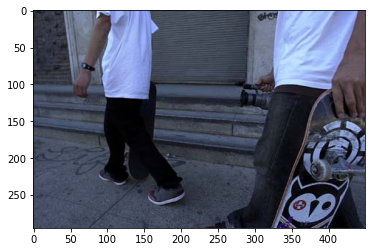

Test 95 : man in black shirt and jeans walks down the street
Meteor score:  0.24952919020715625
Cider score:  0.17909624843239622


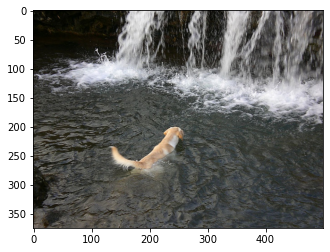

Test 96 : man in red shirt is climbing rock face
Meteor score:  0.0
Cider score:  0.0


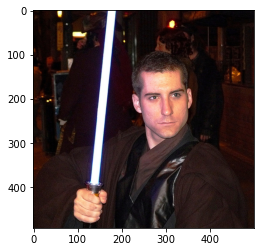

Test 97 : man in black shirt and hat is standing in front of an old building
Meteor score:  0.14285714285714285
Cider score:  0.2480831521867981


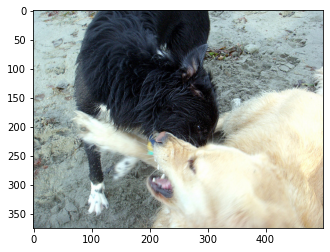

Test 98 : two dogs are playing together on the grass
Meteor score:  0.38448275862068976
Cider score:  0.2631268643263682


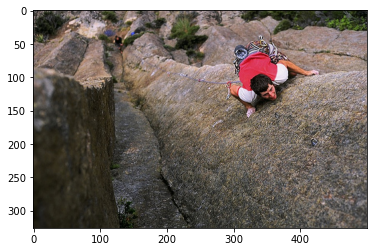

Test 99 : man in red shirt is climbing sheer rock face
Meteor score:  0.48076923076923084
Cider score:  0.2788178850879238


In [55]:
pics = list(encoding_test.keys())


#for i in range(0,len(pics)):
for i in range(0,100):
    pic = pics[i]
    image = encoding_test[pic].reshape((1,2048))
    x=plt.imread(images+pic)
    plt.imshow(x)
    plt.show()
    caption = generated = greedySearch(image)
    
    
    print("Test",i,":",caption)
    print("Meteor score: ", meteor_score(test_descriptions[pic.split('.')[0]],generated))
    print("Cider score: ", cider(test_descriptions[pic.split('.')[0]],generated)[0][0])